In [2]:
# Cited: https://towardsdatascience.com/image-captioning-with-keras-teaching-computers-to-describe-pictures-c88a46a311b8
# Cited: https://machinelearningmastery.com/develop-a-deep-learning-caption-generation-model-in-python/
# Cited: https://github.com/jeffheaton/t81_558_deep_learning/blob/8466852fb7f85bc816dbd08102c10209d4719b16/t81_558_class_10_4_captioning.ipynb

In [37]:
from numpy import loadtxt
import numpy as np
import tensorflow as tf
import keras
import tensorflow_addons as tfa
import time
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from numpy.random import seed
from google.colab import drive
import os
import string
import urllib.request
from scipy import spatial
from sklearn.manifold import TSNE

from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from tensorflow.keras.utils import load_img, img_to_array, to_categorical
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import (LSTM, Embedding,
    TimeDistributed, Dense, RepeatVector,
    Activation, Flatten, Reshape, concatenate,
    Dropout, BatchNormalization, add)
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences

from nltk.translate.bleu_score import corpus_bleu, sentence_bleu

In [9]:
# random seeding for reproducibility
seed(1)
tf.random.set_seed(2)

# Data Preparation

In [10]:
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
filename = "/content/drive/MyDrive/data/image_captioning/annotations_train1.txt"
file = open("/content/drive/MyDrive/data/image_captioning/annotations_train1.txt",encoding='utf-8',errors='ignore')
doc = file.read()
doc2 = doc

In [12]:
descriptions = dict()

for line in doc.split('\n'):
    # split line by white space
    tokens = line.split()
    if len(line) < 2:
      continue
    # take the first token as image id, the rest as description
    image_id, image_desc = tokens[0], tokens[1:]
    #image_id = tokens[0]
    #print("image_id")

    # extract filename from image id
    image_id = image_id.split('.')[0]
    id = image_id
    check = id.split('_')
    print(check)
    # convert description tokens back to string
    image_desc = ' '.join(image_desc)
    if (image_id not in descriptions or check == 'VizWiz'):
      #print(111)
      descriptions[image_id] = list()
    descriptions[image_id].append(image_desc)

Streaming output truncated to the last 5000 lines.
['VizWiz', 'train', '00007001']
['VizWiz', 'train', '00007001']
['VizWiz', 'train', '00007001']
['VizWiz', 'train', '00007001']
['VizWiz', 'train', '00007001']
['VizWiz', 'train', '00007002']
['VizWiz', 'train', '00007002']
['VizWiz', 'train', '00007002']
['VizWiz', 'train', '00007002']
['VizWiz', 'train', '00007002']
['VizWiz', 'train', '00007003']
['VizWiz', 'train', '00007003']
['VizWiz', 'train', '00007003']
['VizWiz', 'train', '00007003']
['VizWiz', 'train', '00007003']
['VizWiz', 'train', '00007004']
['VizWiz', 'train', '00007004']
['VizWiz', 'train', '00007004']
['VizWiz', 'train', '00007004']
['VizWiz', 'train', '00007004']
['VizWiz', 'train', '00007005']
['VizWiz', 'train', '00007005']
['VizWiz', 'train', '00007005']
['VizWiz', 'train', '00007005']
['VizWiz', 'train', '00007005']
['VizWiz', 'train', '00007006']
['VizWiz', 'train', '00007006']
['VizWiz', 'train', '00007006']
['VizWiz', 'train', '00007006']
['VizWiz', 'train', '

In [14]:
train_images_path = os.path.join("/content/drive/MyDrive/data/image_captioning/annotations_train1.txt")
test_images_path = os.path.join("/content/drive/MyDrive/data/image_captioning/annotations_val.txt")

train_img = []
test_img = []

In [16]:
max_length = 0
# prepare translation table for removing punctuation
table = str.maketrans('', '', string.punctuation)
for key, desc_list in descriptions.items():
    for i in range(len(desc_list)):
        desc = desc_list[i]
        # tokenize
        desc = desc.split()
        # convert to lower case
        desc = [word.lower() for word in desc]
        # remove punctuation from each token
        desc = [w.translate(table) for w in desc]
        # remove hanging 's' and 'a'
        desc = [word for word in desc if len(word)>1]
        # remove tokens with numbers in them
        desc = [word for word in desc if word.isalpha()]
        max_length = max(max_length,len(desc))
        # store as string
        desc_list[i] =  ' '.join(desc)

In [19]:
vocabulary = set()
for key in descriptions.keys():
    [vocabulary.update(d.split()) for d in descriptions[key]]
print('Original Vocabulary Size: %d' % len(vocabulary))


Original Vocabulary Size: 10911


In [20]:
lines = list()
for key, desc_list in descriptions.items():
  for desc in desc_list:
    lines.append(key + ' ' + desc)
data = '\n'.join(lines)
file = open('descriptions.txt', 'w')
file.write(data)
file.close()

In [21]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

## Prepare Training Dataset Captions


In [22]:
# load doc into memory
def load_doc(filename):
  # open the file as read only
  file = open(filename,encoding='utf-8',errors='ignore')
  # read all text
  text = file.read()
  # close the file
  file.close()
  return text

In [23]:
filename = 'descriptions.txt'
doc2 = load_doc(filename)

In [24]:
train_descriptions = dict()
for line in doc.split('\n'):
    # split line by white space
    tokens = line.split()
    if (len(tokens) == 0):
      break
    # split id from description
    image_id, image_desc = tokens[0], tokens[1:]
    if (image_id=='image,caption'):
      continue
    id = image_id
    check = id.split('_')
    print(check)
    # skip images not in the set
    #if image_id in dataset:
    ii = image_id.split(',')[0]

    if (id not in descriptions and check != 'VizWiz'):
      #print(ii)
      if (ii !='anything'):
        if (ii !='OR'):
          train_descriptions[ii] = list()
      # wrap description in tokens
      desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
      # store
      if (ii !='anything'):
        if (ii !='OR'):
          train_descriptions[ii].append(desc)


Streaming output truncated to the last 5000 lines.
['VizWiz', 'train', '00004898.jpg,a']
['VizWiz', 'train', '00004898.jpg,"a']
['VizWiz', 'train', '00004898.jpg,A']
['VizWiz', 'train', '00004898.jpg,A']
['VizWiz', 'train', '00004898.jpg,an']
['VizWiz', 'train', '00004899.jpg,A']
['VizWiz', 'train', '00004899.jpg,can']
['VizWiz', 'train', '00004899.jpg,"An']
['VizWiz', 'train', '00004899.jpg,Can']
['VizWiz', 'train', '00004899.jpg,An']
['VizWiz', 'train', '00004900.jpg,Quality']
['VizWiz', 'train', '00004900.jpg,The']
['VizWiz', 'train', '00004900.jpg,Blue']
['VizWiz', 'train', '00004900.jpg,"Canned']
['VizWiz', 'train', '00004900.jpg,a']
['VizWiz', 'train', '00004901.jpg,a']
['VizWiz', 'train', '00004901.jpg,"A']
['VizWiz', 'train', '00004901.jpg,A']
['VizWiz', 'train', '00004901.jpg,"Hand']
['VizWiz', 'train', '00004901.jpg,"a']
['VizWiz', 'train', '00004902.jpg,A']
['VizWiz', 'train', '00004902.jpg,A']
['VizWiz', 'train', '00004902.jpg,"A']
['VizWiz', 'train', '00004902.jpg,An']
['V

In [28]:
train_descriptions

{'VizWiz_train_00000000.jpg': ['startseq basil leaves in a container on a counter endseq'],
 'VizWiz_train_00000001.jpg': ['startseq counter with canisters, kettle and can of soda." endseq'],
 'VizWiz_train_00000002.jpg': ['startseq is a can of crushed tomatoes in view. endseq'],
 'VizWiz_train_00000003.jpg': ['startseq screenshot of Spotify page on a cell phone saying click here to start download, showing a captcha that says T36M (case sensitive)." endseq'],
 'VizWiz_train_00000004.jpg': ['startseq blue and yellow box with lights for the garden inside. endseq'],
 'VizWiz_train_00000005.jpg': ["startseq person's feet wearing brown shoes on a white floor. endseq"],
 'VizWiz_train_00000006.jpg': ['startseq orange and white packet of mouth rinse called equate is seen. endseq'],
 'VizWiz_train_00000007.jpg': ["startseq cleaning kit is shown in plastic packaging on someone's legs endseq"],
 'VizWiz_train_00000008.jpg': ["startseq bag of Farley's brand orange slice candies. endseq"],
 'VizWi

In [29]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
print(len(all_train_captions))

# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]

print('preprocessed words %d ' % len(vocab))
# preprocessed words 1651

5897
preprocessed words 629 


In [30]:
vocab_size = len(vocab)+1
vocab_size

630

In [31]:
len(train_descriptions)

5897

## Prepare Validation Dataset Captions

In [32]:
file = open("/content/drive/MyDrive/data/image_captioning/annotations_val.txt",encoding='utf-8',errors='ignore')
doc_val = file.read()

In [33]:
descriptions2 = dict()

for line in doc_val.split('\n'):
    # split line by white space
    tokens = line.split()
    if len(line) < 2:
      continue
    # take the first token as image id, the rest as description
    image_id, image_desc = tokens[0], tokens[1:]

    # extract filename from image id
    image_id = image_id.split('.')[0]
    id = image_id
    check = id.split('_')
    print(check)
    # convert description tokens back to string
    image_desc = ' '.join(image_desc)
    if (image_id not in descriptions2 or check == 'VizWiz'):
      descriptions2[image_id] = list()
    descriptions2[image_id].append(image_desc)

Streaming output truncated to the last 5000 lines.
['VizWiz', 'val', '00006752']
['VizWiz', 'val', '00006752']
['VizWiz', 'val', '00006752']
['VizWiz', 'val', '00006752']
['VizWiz', 'val', '00006752']
['VizWiz', 'val', '00006753']
['VizWiz', 'val', '00006753']
['VizWiz', 'val', '00006753']
['VizWiz', 'val', '00006753']
['VizWiz', 'val', '00006753']
['VizWiz', 'val', '00006754']
['VizWiz', 'val', '00006754']
['VizWiz', 'val', '00006754']
['VizWiz', 'val', '00006754']
['VizWiz', 'val', '00006754']
['VizWiz', 'val', '00006755']
['VizWiz', 'val', '00006755']
['VizWiz', 'val', '00006755']
['VizWiz', 'val', '00006755']
['VizWiz', 'val', '00006755']
['VizWiz', 'val', '00006756']
['VizWiz', 'val', '00006756']
['VizWiz', 'val', '00006756']
['VizWiz', 'val', '00006756']
['VizWiz', 'val', '00006756']
['VizWiz', 'val', '00006757']
['VizWiz', 'val', '00006757']
['VizWiz', 'val', '00006757']
['VizWiz', 'val', '00006757']
['VizWiz', 'val', '00006757']
['VizWiz', 'val', '00006758']
['VizWiz', 'val', '

In [34]:
max_length2 = 0
# prepare translation table for removing punctuation
table2 = str.maketrans('', '', string.punctuation)
for key, desc_list in descriptions2.items():
    for i in range(len(desc_list)):
        desc = desc_list[i]
        # tokenize
        desc = desc.split()
        # convert to lower case
        desc = [word.lower() for word in desc]
        # remove punctuation from each token
        desc = [w.translate(table2) for w in desc]
        # remove hanging 's' and 'a'
        desc = [word for word in desc if len(word)>1]
        # remove tokens with numbers in them
        desc = [word for word in desc if word.isalpha()]
        max_length2 = max(max_length2,len(desc))
        # store as string
        desc_list[i] =  ' '.join(desc)

In [35]:
vocabulary2 = set()
for key in descriptions2.keys():
    [vocabulary2.update(d.split()) for d in descriptions2[key]]
print('Original Vocabulary Size of Val: %d' % len(vocabulary2))


Original Vocabulary Size of Val: 10886


In [36]:
val_descriptions = dict()
#identifier = doc2.split('\n')[0]
for line in doc_val.split('\n'):
    # split line by white space
    tokens = line.split()
    if (len(tokens) == 0):
      break
    # split id from description
    image_id, image_desc = tokens[0], tokens[1:]
    if (image_id=='image,caption'):
      continue
    id = image_id
    check = id.split('_')
    print(check)
    # skip images not in the set
    #if image_id in dataset:
    ii = image_id.split(',')[0]

    if (id not in descriptions2 and check != 'VizWiz'):
      if (ii !='anything'):
        if (ii !='OR'):
          val_descriptions[ii] = list()
      # wrap description in tokens
      desc =  ' '.join(image_desc)
      # store
      if (ii !='anything'):
        if (ii !='OR'):
          val_descriptions[ii].append(desc)

Streaming output truncated to the last 5000 lines.
['VizWiz', 'val', '00006752.jpg,a']
['VizWiz', 'val', '00006752.jpg,An']
['VizWiz', 'val', '00006752.jpg,A']
['VizWiz', 'val', '00006752.jpg,A']
['VizWiz', 'val', '00006752.jpg,A']
['VizWiz', 'val', '00006753.jpg,A']
['VizWiz', 'val', '00006753.jpg,A']
['VizWiz', 'val', '00006753.jpg,A']
['VizWiz', 'val', '00006753.jpg,A']
['VizWiz', 'val', '00006753.jpg,Bottle']
['VizWiz', 'val', '00006754.jpg,a']
['VizWiz', 'val', '00006754.jpg,A']
['VizWiz', 'val', '00006754.jpg,Two']
['VizWiz', 'val', '00006754.jpg,a']
['VizWiz', 'val', '00006754.jpg,A']
['VizWiz', 'val', '00006755.jpg,appears']
['VizWiz', 'val', '00006755.jpg,A']
['VizWiz', 'val', '00006755.jpg,A']
['VizWiz', 'val', '00006755.jpg,A']
['VizWiz', 'val', '00006755.jpg,A']
['VizWiz', 'val', '00006756.jpg,"The']
['VizWiz', 'val', '00006756.jpg,A']
['VizWiz', 'val', '00006756.jpg,image']
['VizWiz', 'val', '00006756.jpg,A']
['VizWiz', 'val', '00006756.jpg,A']
['VizWiz', 'val', '00006757.

# CNN Model

Use the InceptionV3 model for feature extraction from the images with transfer learning

In [41]:
cnn_model = InceptionV3(weights='imagenet')
cnn_model = Model(cnn_model.input, cnn_model.layers[-2].output)
WIDTH = 299
HEIGHT = 299
OUTPUT_DIM = 2048
preprocess_input = tf.keras.applications.inception_v3.preprocess_input

In [42]:
cnn_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_188 (Conv2D)            (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_188 (Batch  (None, 149, 149, 32  96         ['conv2d_188[0][0]']             
 Normalization)                 )                                                           

# Feature Extraction from Images

In [43]:
def encodeImage(img):
  # Resize all images to a standard size (specified by the image encoding network)
  img = img.resize((WIDTH, HEIGHT))
  # Convert a PIL image to a numpy array
  x = tf.keras.preprocessing.image.img_to_array(img)
  # Expand to 2D array
  x = np.expand_dims(x, axis=0)
  # Perform any preprocessing needed by InceptionV3 or others
  x = preprocess_input(x)
  # Call InceptionV3 (or other) to extract the smaller feature set for the image.
  x = cnn_model.predict(x) # Get the encoding vector for the image
  # Shape to correct form to be accepted by LSTM captioning network.
  x = np.reshape(x, OUTPUT_DIM )
  return x

In [44]:
# extract features from each photo
encoding_train = {}
directory = "/content/drive/MyDrive/data/image_captioning/train1"
for name in os.listdir(directory):
  # load an image from file
  filename = directory + '/' + name
  image = load_img(filename, target_size=(HEIGHT, WIDTH))
  image_id = name.split('\n')[0]
  print(image_id)
  encoding_train[image_id] = encodeImage(image)
  print('>%s' % name)



Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 54ms/step
>VizWiz_train_00001358.jpg
VizWiz_train_00001382.jpg
1/1 [==============================] - 0s 49ms/step
>VizWiz_train_00001382.jpg
VizWiz_train_00001443.jpg
1/1 [==============================] - 0s 52ms/step
>VizWiz_train_00001443.jpg
VizWiz_train_00001338.jpg
1/1 [==============================] - 0s 50ms/step
>VizWiz_train_00001338.jpg
VizWiz_train_00001427.jpg
1/1 [==============================] - 0s 52ms/step
>VizWiz_train_00001427.jpg
VizWiz_train_00001389.jpg
1/1 [==============================] - 0s 57ms/step
>VizWiz_train_00001389.jpg
VizWiz_train_00001377.jpg
1/1 [==============================] - 0s 52ms/step
>VizWiz_train_00001377.jpg
VizWiz_train_00001385.jpg
1/1 [==============================] - 0s 48ms/step
>VizWiz_train_00001385.jpg
VizWiz_train_00001305.jpg
1/1 [==============================] - 0s 46ms/step
>VizWiz_train_00001305.jpg
VizWiz_train_00001329.jpg
1/1 

In [45]:
# extract features from each photo
encoding_test = {}
directory = "/content/drive/MyDrive/data/image_captioning/val/val"
for name in os.listdir(directory):
  # load an image from file
  filename = directory + '/' + name
  image = load_img(filename, target_size=(HEIGHT, WIDTH))
  image_id = name.split('\n')[0]
  encoding_test[image_id] = encodeImage(image)
  print('>%s' % image_id)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 27ms/step
>VizWiz_val_00001949.jpg
1/1 [==============================] - 0s 32ms/step
>VizWiz_val_00001967.jpg
1/1 [==============================] - 0s 25ms/step
>VizWiz_val_00001993.jpg
1/1 [==============================] - 0s 28ms/step
>VizWiz_val_00002045.jpg
1/1 [==============================] - 0s 26ms/step
>VizWiz_val_00001994.jpg
1/1 [==============================] - 0s 26ms/step
>VizWiz_val_00001935.jpg
1/1 [==============================] - 0s 32ms/step
>VizWiz_val_00002022.jpg
1/1 [==============================] - 0s 31ms/step
>VizWiz_val_00002031.jpg
1/1 [==============================] - 0s 28ms/step
>VizWiz_val_00002004.jpg
1/1 [==============================] - 0s 26ms/step
>VizWiz_val_00001941.jpg
1/1 [==============================] - 0s 34ms/step
>VizWiz_val_00001951.jpg
1/1 [==============================] - 0s 28ms/step
>VizWiz_val_00001934.jpg
1/1 [====================

In [46]:
idxtoword = {}
wordtoidx = {}

ix = 1
for w in vocab:
    wordtoidx[w] = ix
    idxtoword[ix] = w
    ix += 1

vocab_size = len(idxtoword) + 1
vocab_size

630

In [47]:
# adding the start and end tokens
max_length +=2
print(max_length)

80


# Using Data Generator

In [48]:
def data_generator(descriptions, photos, wordtoidx, max_length, num_photos_per_batch):
  # x1 - Training data for photos
  # x2 - The caption that goes with each photo
  # y - The predicted rest of the caption
  x1, x2, y = list(), list(), list()
  n=0
  while True:
    for key, desc_list in descriptions.items():
      n+=1
      photo = photos[key]
      # Each photo has 5 descriptions
      for desc in desc_list:
        # Convert each word into a list of sequences.
        seq = [wordtoidx[word] for word in desc.split(' ') if word in wordtoidx]
        # Generate a training case for every possible sequence and outcome
        for i in range(1, len(seq)):
          in_seq, out_seq = seq[:i], seq[i]
          in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
          out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
          x1.append(photo)
          x2.append(in_seq)
          y.append(out_seq)
      if n==num_photos_per_batch:
        yield ([np.array(x1), np.array(x2)], np.array(y))
        x1, x2, y = list(), list(), list()
        n=0

# Loading Glove Embeddings

In [50]:
urllib.request.urlretrieve('https://nlp.stanford.edu/data/glove.6B.zip','glove.6B.zip')

('glove.6B.zip', <http.client.HTTPMessage at 0x7d95117c77c0>)

In [51]:
!unzip "/content/glove.6B.zip" -d "/content/"

Archive:  /content/glove.6B.zip
  inflating: /content/glove.6B.50d.txt  
  inflating: /content/glove.6B.100d.txt  
  inflating: /content/glove.6B.200d.txt  
  inflating: /content/glove.6B.300d.txt  


In [52]:
# Load Glove vectors
glove_dir = 'dataset/glove'
embeddings_index = {} # empty dictionary
with open('/content/glove.6B.200d.txt','r') as f:
  for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print(f'Found {len(embeddings_index)} word vectors.')

Found 400000 word vectors.


In [53]:
embedding_dim = 200
# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in wordtoidx.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [54]:
inputs1 = tf.keras.Input(shape=(OUTPUT_DIM,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = tf.keras.Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
caption_model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [55]:
embedding_dim

200

In [56]:
caption_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 80)]         0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 80, 200)      126000      ['input_5[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_4[0][0]']                
                                                                                            

In [57]:
caption_model.layers[2].set_weights([embedding_matrix])
caption_model.layers[2].trainable = False
caption_model.compile(loss='categorical_crossentropy', optimizer='adam')

# Train the Neural Network

In [58]:
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [60]:
encoding_train['VizWiz_train_00000600.jpg'].shape

(2048,)

# Optimization

## Model 1

In [61]:
model_path = os.path.join('caption-model2.hdf5')
if not os.path.exists(model_path):
  for i in tqdm(range(5*2)):
      generator = data_generator(train_descriptions, encoding_train,
                                 wordtoidx, max_length, number_pics_per_bath)
      caption_model.fit_generator(generator, epochs=1,steps_per_epoch=steps, verbose=1)

  caption_model.optimizer.lr = 1e-4
  number_pics_per_bath = 6
  steps = len(train_descriptions)//number_pics_per_bath

  for i in range(5):
      generator = data_generator(train_descriptions, encoding_train,
                    wordtoidx, max_length, number_pics_per_bath)
      caption_model.fit_generator(generator, epochs=1,
                            steps_per_epoch=steps, verbose=1)
  caption_model.save_weights(model_path)
  #print(f"\Training took: {hms_string(time()-start)}")
else:
  caption_model.load_weights(model_path)

  0%|          | 0/10 [00:00<?, ?it/s]<ipython-input-61-30c9df3cac0e>:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  caption_model.fit_generator(generator, epochs=1,steps_per_epoch=steps, verbose=1)


1965/1965 [==============================] - 468s 235ms/step - loss: 3.7502


 10%|█         | 1/10 [08:25<1:15:53, 505.92s/it]

1965/1965 [==============================] - 456s 232ms/step - loss: 3.2179


 20%|██        | 2/10 [16:47<1:07:08, 503.59s/it]

1965/1965 [==============================] - 457s 233ms/step - loss: 3.0163


 30%|███       | 3/10 [25:09<58:39, 502.85s/it]  

1965/1965 [==============================] - 453s 231ms/step - loss: 2.8779


 40%|████      | 4/10 [33:31<50:14, 502.50s/it]

1965/1965 [==============================] - 456s 232ms/step - loss: 2.7706


 50%|█████     | 5/10 [41:07<40:28, 485.78s/it]

1965/1965 [==============================] - 451s 230ms/step - loss: 2.6797


 60%|██████    | 6/10 [48:39<31:35, 474.00s/it]

1965/1965 [==============================] - 458s 233ms/step - loss: 2.5929


 70%|███████   | 7/10 [57:01<24:09, 483.14s/it]

1965/1965 [==============================] - 463s 235ms/step - loss: 2.5240


 80%|████████  | 8/10 [1:04:43<15:53, 476.61s/it]

1965/1965 [==============================] - 461s 235ms/step - loss: 2.4600


 90%|█████████ | 9/10 [1:12:24<07:51, 471.72s/it]

1965/1965 [==============================] - 457s 233ms/step - loss: 2.4008


100%|██████████| 10/10 [1:20:46<00:00, 484.66s/it]
<ipython-input-61-30c9df3cac0e>:15: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  caption_model.fit_generator(generator, epochs=1,


982/982 [==============================] - 228s 232ms/step - loss: 2.1905


# Generating  Captions

In [62]:
def generateCaption(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoidx[w] for w in in_text.split() if w in wordtoidx]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = caption_model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idxtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [63]:
def generateCaption(photo,caption_model):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoidx[w] for w in in_text.split() if w in wordtoidx]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = caption_model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idxtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

# Evaluate

In [64]:
val_descriptions['VizWiz_val_00000000.jpg']

['top of a laptop with a blue background and dark blue text.']

0
image_name VizWiz_val_00006641.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006641.jpg


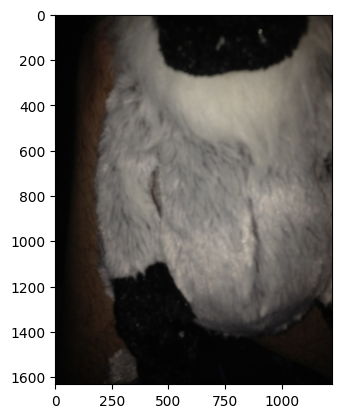

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['stuffed animal with gray, black and white fur sits on a neutral surface."']
_____________________________________
BLEU-1: 0.479776
BLEU-2: 0.248618
BLEU-3: 0.112989
BLEU-4: 0.000000
1
image_name VizWiz_val_00006659.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006659.jpg


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


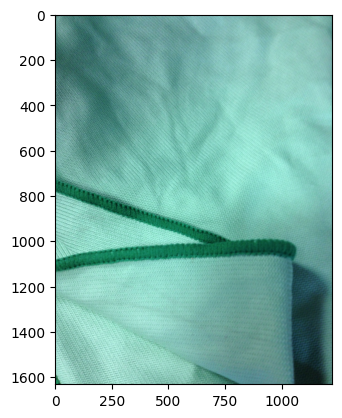

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['green cloth fabric towel folded onto itself.']
_____________________________________
BLEU-1: 0.660000
BLEU-2: 0.384920
BLEU-3: 0.245463
BLEU-4: 0.000000
2
image_name VizWiz_val_00006748.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006748.jpg


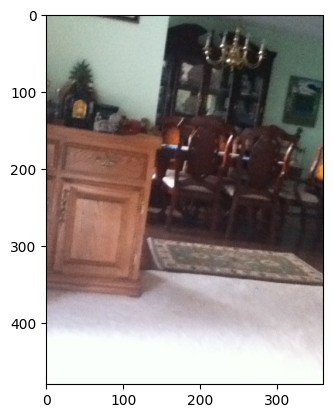

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['dining table with several chairs sits in front of a wood and glass cabinet with a small bureau in the foreground.']
_____________________________________
BLEU-1: 0.266635
BLEU-2: 0.180038
BLEU-3: 0.121197
BLEU-4: 0.075428
3
image_name VizWiz_val_00006638.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006638.jpg


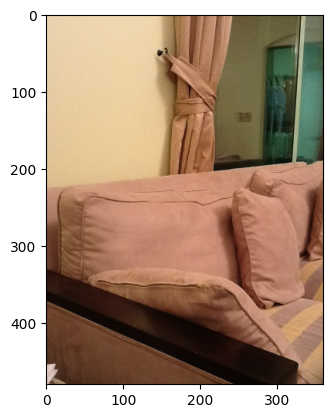

VizWiz_val_00000812.jpg
Caption: with a and a
Actual:  ['pink and beige sofa with matching pink curtains']
_____________________________________
BLEU-1: 0.054114
BLEU-2: 0.048948
BLEU-3: 0.043713
BLEU-4: 0.036984
4
image_name VizWiz_val_00006757.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006757.jpg


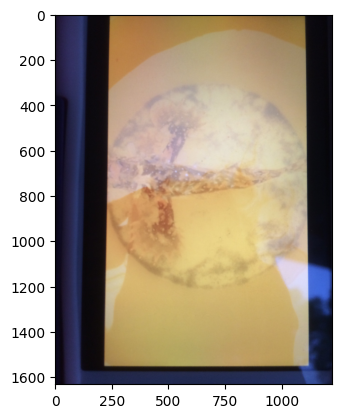

VizWiz_val_00000812.jpg
Caption: screen showing a blue screen with a black background and a black background on it.
Actual:  ['and brown ocean themed art in a blue frame']
_____________________________________
BLEU-1: 0.475610
BLEU-2: 0.359413
BLEU-3: 0.280997
BLEU-4: 0.182270
5
image_name VizWiz_val_00006688.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006688.jpg


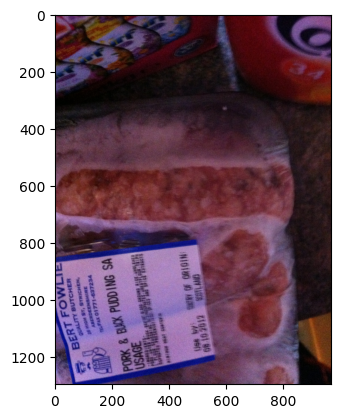

VizWiz_val_00000812.jpg
Caption: package of food is on top of a table.
Actual:  ['package of Bert Fowlie Pork & Black Pudding Sausage.']
_____________________________________
BLEU-1: 0.522554
BLEU-2: 0.326271
BLEU-3: 0.288917
BLEU-4: 0.231314
6
image_name VizWiz_val_00006677.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006677.jpg


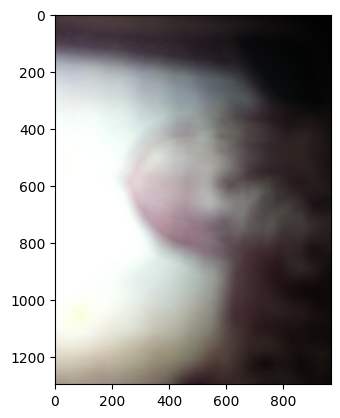

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['issues are too severe to recognize visual content.']
_____________________________________
BLEU-1: 1.000000
BLEU-2: 1.000000
BLEU-3: 1.000000
BLEU-4: 1.000000
7
image_name VizWiz_val_00006697.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006697.jpg


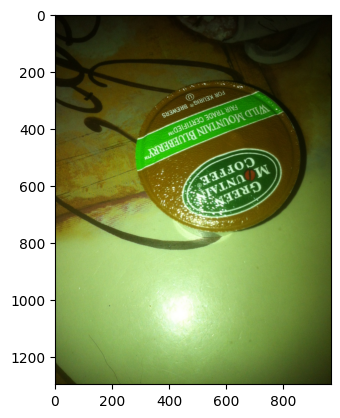

VizWiz_val_00000812.jpg
Caption: of a with a red and white
Actual:  ['is a pod for a coffee maker.']
_____________________________________
BLEU-1: 0.567629
BLEU-2: 0.354768
BLEU-3: 0.245987
BLEU-4: 0.000000
8
image_name VizWiz_val_00006686.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006686.jpg


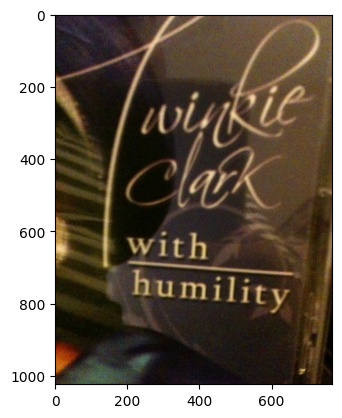

VizWiz_val_00000812.jpg
Caption: package of food is on top of a table.
Actual:  ['close-up of some type of product, about Twinkie Clark."']
_____________________________________
BLEU-1: 0.548320
BLEU-2: 0.335210
BLEU-3: 0.251712
BLEU-4: 0.171075
9
image_name VizWiz_val_00006685.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006685.jpg


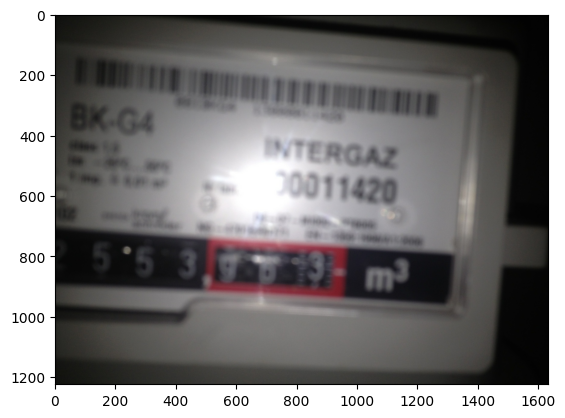

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['white box with black writing and numbers featuring a barcode.']
_____________________________________
BLEU-1: 0.577814
BLEU-2: 0.257379
BLEU-3: 0.000000
BLEU-4: 0.000000
10
image_name VizWiz_val_00006622.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006622.jpg


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


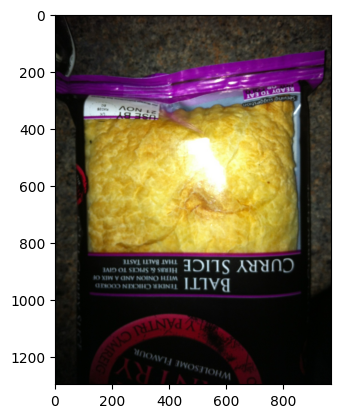

VizWiz_val_00000812.jpg
Caption: package of food is on top of a table.
Actual:  ['is a picture of a ready to eat food package.']
_____________________________________
BLEU-1: 0.693420
BLEU-2: 0.592211
BLEU-3: 0.535348
BLEU-4: 0.434158
11
image_name VizWiz_val_00006681.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006681.jpg


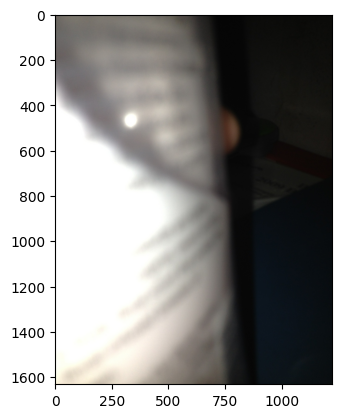

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['issues are too severe to recognize visual content.']
_____________________________________
BLEU-1: 1.000000
BLEU-2: 1.000000
BLEU-3: 1.000000
BLEU-4: 1.000000
12
image_name VizWiz_val_00006727.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006727.jpg


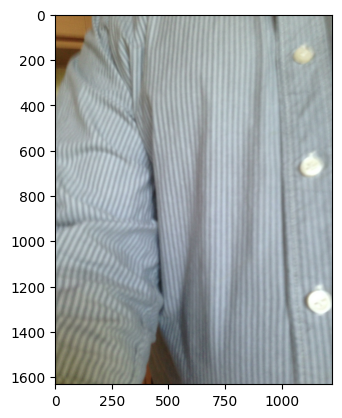

VizWiz_val_00000812.jpg
Caption: black and white dog looking to the
Actual:  ['vertical blue striped long sleeve button down shirt']
_____________________________________
BLEU-1: 0.499496
BLEU-2: 0.317784
BLEU-3: 0.202307
BLEU-4: 0.000000
13
image_name VizWiz_val_00006812.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006812.jpg


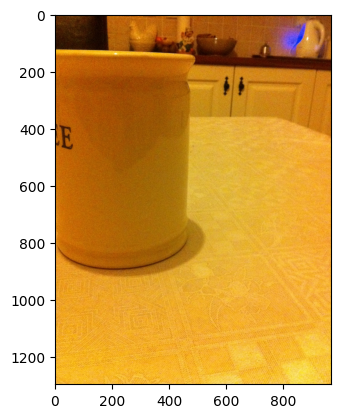

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['yellow jar sitting on the kitchen table with bowl and decoration at the back of it.']
_____________________________________
BLEU-1: 0.392807
BLEU-2: 0.240845
BLEU-3: 0.102333
BLEU-4: 0.000000
14
image_name VizWiz_val_00006881.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006881.jpg


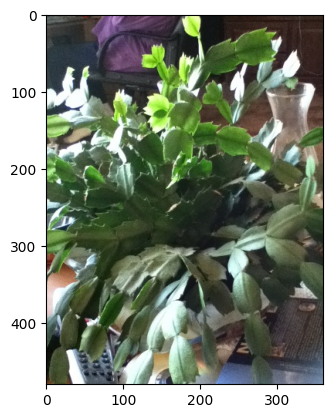

VizWiz_val_00000812.jpg
Caption: black and white cat looking to a
Actual:  ['green Christmas cactus plant that looks healthy']
_____________________________________
BLEU-1: 0.508450
BLEU-2: 0.350951
BLEU-3: 0.272914
BLEU-4: 0.190989
15
image_name VizWiz_val_00006800.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006800.jpg


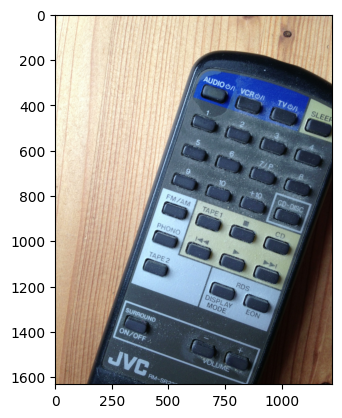

VizWiz_val_00000812.jpg
Caption: television remote sits on a table with a TV
Actual:  ['older, dusty, JVC remote with basic buttons."']
_____________________________________
BLEU-1: 0.688166
BLEU-2: 0.467936
BLEU-3: 0.419387
BLEU-4: 0.331277
16
image_name VizWiz_val_00006808.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006808.jpg


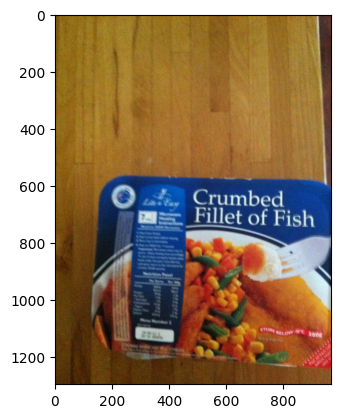

VizWiz_val_00000812.jpg
Caption: package of food is lying on top of a table.
Actual:  ['of microwavable Crumbed Fillet of Fish with vegetables is in photo.']
_____________________________________
BLEU-1: 0.465803
BLEU-2: 0.337998
BLEU-3: 0.255553
BLEU-4: 0.164375
17
image_name VizWiz_val_00006923.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006923.jpg


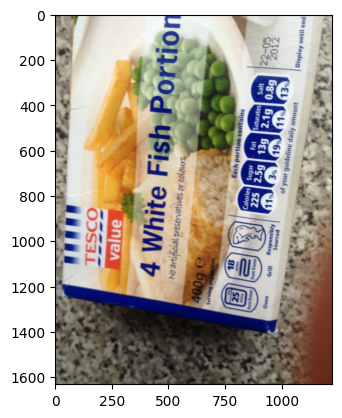

VizWiz_val_00000812.jpg
Caption: box of and cheese
Actual:  ['fish dinner is lying on top of a table.']
_____________________________________
BLEU-1: 0.225762
BLEU-2: 0.124389
BLEU-3: 0.105285
BLEU-4: 0.075921
18
image_name VizWiz_val_00006921.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006921.jpg


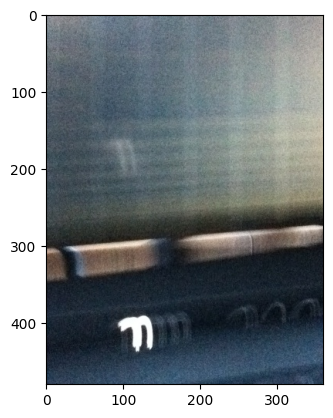

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['silver curves, a brown line and a gray screen"']
_____________________________________
BLEU-1: 0.660000
BLEU-2: 0.348173
BLEU-3: 0.166228
BLEU-4: 0.000000
19
image_name VizWiz_val_00006926.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006926.jpg


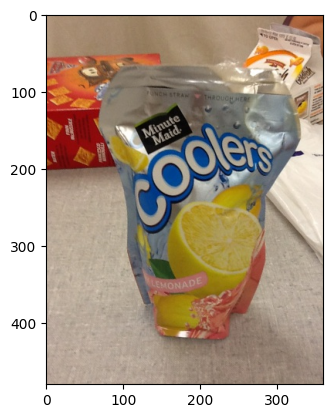

VizWiz_val_00000812.jpg
Caption: bag of chips is on top of a table.
Actual:  ['and cooler drink on a floor by a futon']
_____________________________________
BLEU-1: 0.627536
BLEU-2: 0.367757
BLEU-3: 0.257330
BLEU-4: 0.134087
20
image_name VizWiz_val_00006831.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006831.jpg


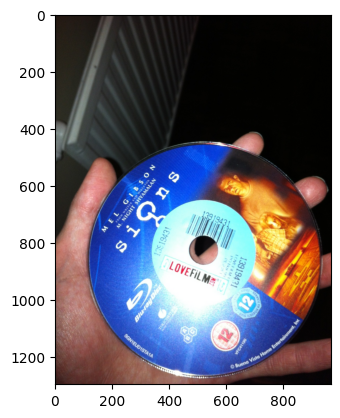

VizWiz_val_00000812.jpg
Caption: of a with a red and white
Actual:  ['GIBSON SIGNS LOVE FILM BLU RAY DISC BUENOS ENTERTAINMENT HORROR MOVIES']
_____________________________________
BLEU-1: 0.039672
BLEU-2: 0.000000
BLEU-3: 0.000000
BLEU-4: 0.000000
21
image_name VizWiz_val_00006814.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006814.jpg


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


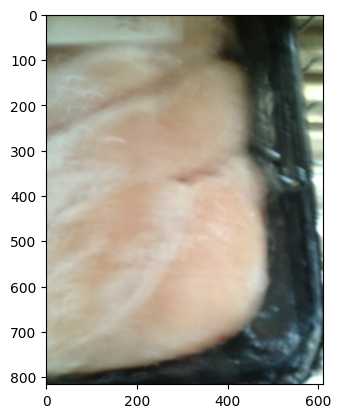

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['PACKAGED FROZEN MEAT, UP CLOSE SNAPSHOT"']
_____________________________________
BLEU-1: 0.100000
BLEU-2: 0.000000
BLEU-3: 0.000000
BLEU-4: 0.000000
22
image_name VizWiz_val_00006790.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006790.jpg


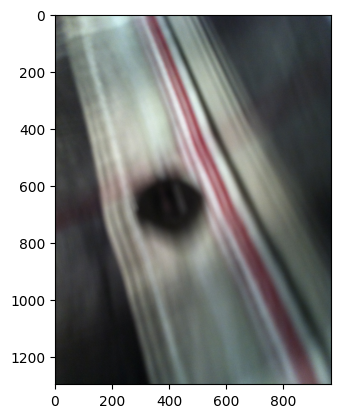

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['very striped t shirt with some buttons on it']
_____________________________________
BLEU-1: 0.620000
BLEU-2: 0.318158
BLEU-3: 0.157476
BLEU-4: 0.000000
23
image_name VizWiz_val_00006804.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006804.jpg


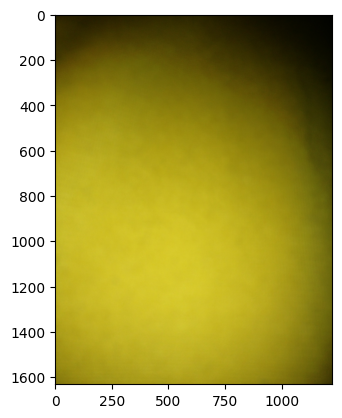

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['bright unrecognizable photo that might be surface of a lemon']
_____________________________________
BLEU-1: 0.654985
BLEU-2: 0.431333
BLEU-3: 0.312825
BLEU-4: 0.209729
24
image_name VizWiz_val_00006848.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006848.jpg


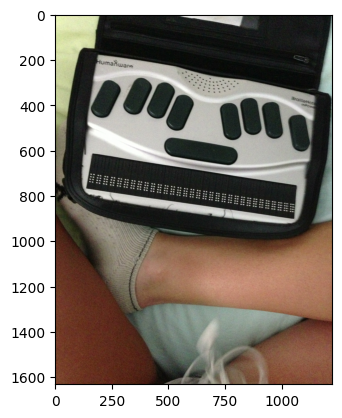

VizWiz_val_00000812.jpg
Caption: person is wearing a watch on his
Actual:  ["black and silver electronic device next to a person's leg"]
_____________________________________
BLEU-1: 0.400604
BLEU-2: 0.230755
BLEU-3: 0.177308
BLEU-4: 0.117780
25
image_name VizWiz_val_00006796.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006796.jpg


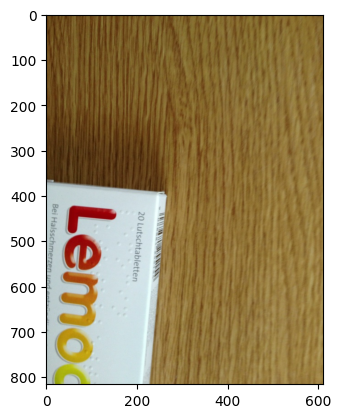

VizWiz_val_00000812.jpg
Caption: box of and cheese
Actual:  ['package is lying on top of a table.']
_____________________________________
BLEU-1: 0.265249
BLEU-2: 0.151662
BLEU-3: 0.130286
BLEU-4: 0.094298
26
image_name VizWiz_val_00006879.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006879.jpg


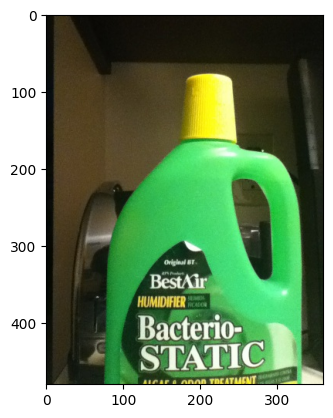

VizWiz_val_00000812.jpg
Caption: bottle of wine is on top of a table.
Actual:  ['bottle of cleaner is on top of a counter.']
_____________________________________
BLEU-1: 0.797798
BLEU-2: 0.718191
BLEU-3: 0.680612
BLEU-4: 0.625641
27
image_name VizWiz_val_00006868.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006868.jpg


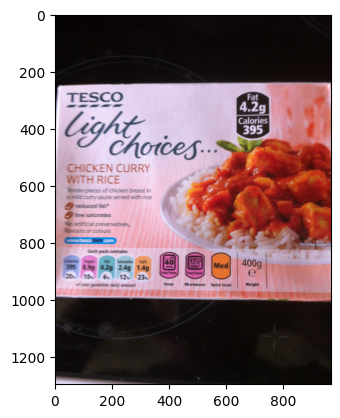

VizWiz_val_00000812.jpg
Caption: package of food is lying on top of a table.
Actual:  ['box of Tesco Light Choices sits on a ceramic stove.']
_____________________________________
BLEU-1: 0.579234
BLEU-2: 0.354894
BLEU-3: 0.265214
BLEU-4: 0.151684
28
image_name VizWiz_val_00006763.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006763.jpg


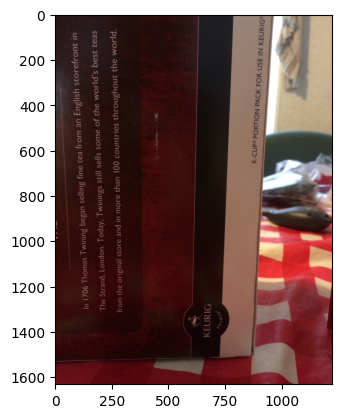

VizWiz_val_00000812.jpg
Caption: of a box of with a on the cover.
Actual:  ['box of Keurig k-cups sitting on a surface with a red and white checkered tablecloth and other items in the background.']
_____________________________________
BLEU-1: 0.065924
BLEU-2: 0.060149
BLEU-3: 0.055101
BLEU-4: 0.046701
29
image_name VizWiz_val_00006822.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006822.jpg


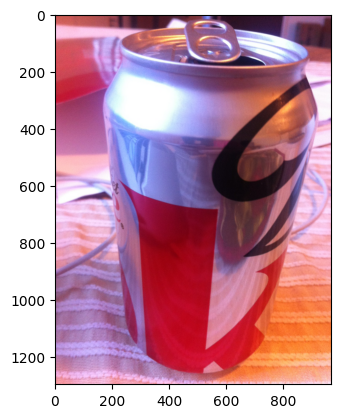

VizWiz_val_00000812.jpg
Caption: bottle of wine is on top of a table.
Actual:  ['opened red and silver metal can of soda.']
_____________________________________
BLEU-1: 0.621416
BLEU-2: 0.356513
BLEU-3: 0.220195
BLEU-4: 0.116056
30
image_name VizWiz_val_00006884.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006884.jpg


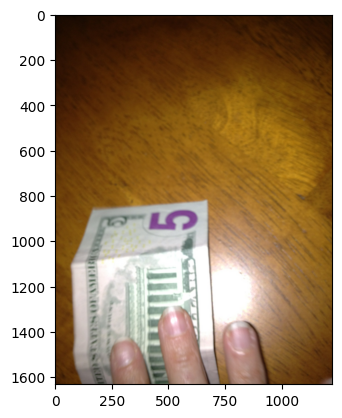

VizWiz_val_00000812.jpg
Caption: of a box of with a on the cover.
Actual:  ["American Five dollar bill on top of a table under somebody's hand."]
_____________________________________
BLEU-1: 0.302392
BLEU-2: 0.217245
BLEU-3: 0.169039
BLEU-4: 0.122714
31
image_name VizWiz_val_00006910.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006910.jpg


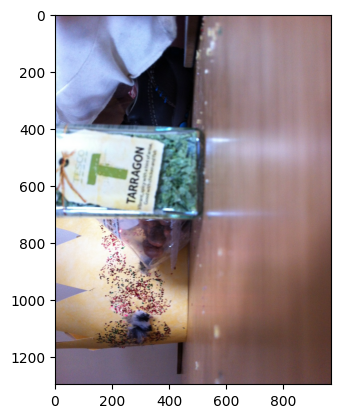

VizWiz_val_00000812.jpg
Caption: bottle of is on top of a table.
Actual:  ['glass container of tarragon sits on a brown surface.']
_____________________________________
BLEU-1: 0.442387
BLEU-2: 0.299800
BLEU-3: 0.241674
BLEU-4: 0.156488
32
image_name VizWiz_val_00006772.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006772.jpg


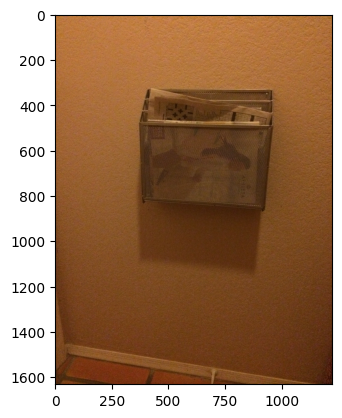

VizWiz_val_00000812.jpg
Caption: of a with a
Actual:  ['magazine holder is hanging on the wall.']
_____________________________________
BLEU-1: 0.071307
BLEU-2: 0.033446
BLEU-3: 0.000000
BLEU-4: 0.000000
33
image_name VizWiz_val_00006912.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006912.jpg


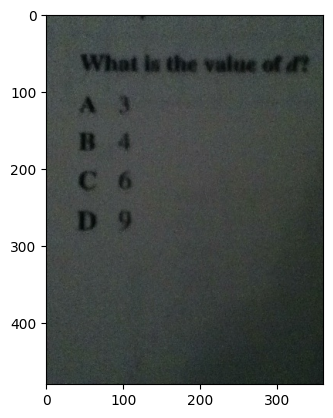

VizWiz_val_00000812.jpg
Caption: piece of paper with a black background and white text on it
Actual:  ['of white paper with the question What is the value of d? With answer of 3, 4, 6, 9."']
_____________________________________
BLEU-1: 0.510367
BLEU-2: 0.415697
BLEU-3: 0.369454
BLEU-4: 0.297130
34
image_name VizWiz_val_00006810.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006810.jpg


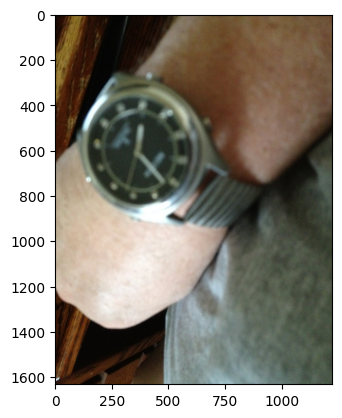

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['man is wearing a watch on his wrist.']
_____________________________________
BLEU-1: 0.540000
BLEU-2: 0.277746
BLEU-3: 0.000000
BLEU-4: 0.000000
35
image_name VizWiz_val_00006900.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006900.jpg


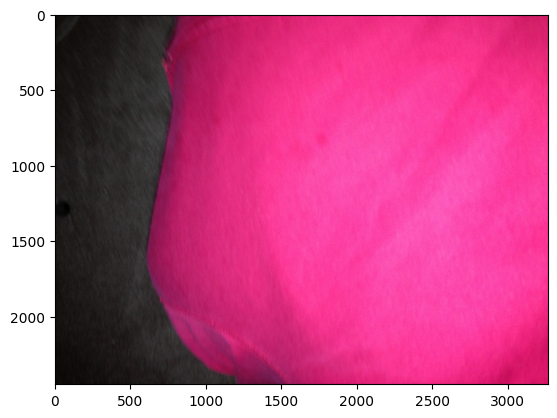

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['issues are too severe to recognize visual content.']
_____________________________________
BLEU-1: 1.000000
BLEU-2: 1.000000
BLEU-3: 1.000000
BLEU-4: 1.000000
36
image_name VizWiz_val_00006768.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006768.jpg


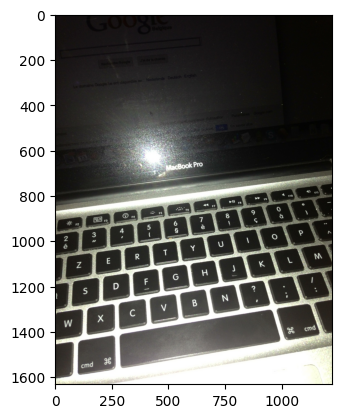

VizWiz_val_00000812.jpg
Caption: black keyboard with a screen and a white
Actual:  ['MacBook pro that is currently on and being used']
_____________________________________
BLEU-1: 0.671566
BLEU-2: 0.380199
BLEU-3: 0.265637
BLEU-4: 0.171713
37
image_name VizWiz_val_00006813.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006813.jpg


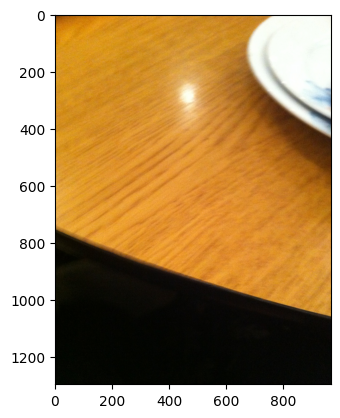

VizWiz_val_00000812.jpg
Caption: issues are too severe to recognize visual content.
Actual:  ['issues are too severe to recognize visual content.']
_____________________________________
BLEU-1: 1.000000
BLEU-2: 1.000000
BLEU-3: 1.000000
BLEU-4: 1.000000
38
image_name VizWiz_val_00006840.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006840.jpg


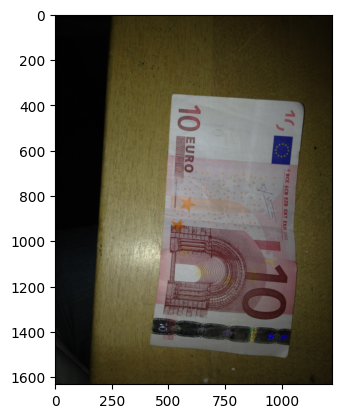

VizWiz_val_00000812.jpg
Caption: box of frozen Italian with
Actual:  ['ten euro bill sitting on a wooden table.']
_____________________________________
BLEU-1: 0.448958
BLEU-2: 0.289569
BLEU-3: 0.147723
BLEU-4: 0.000000
39
image_name VizWiz_val_00006825.jpg
/content/drive/MyDrive/data/image_captioning/val/val/VizWiz_val_00006825.jpg


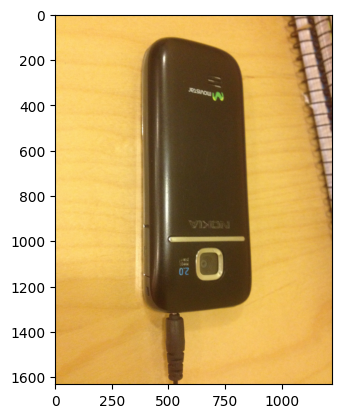

VizWiz_val_00000812.jpg
Caption: black phone with a black screen and a white
Actual:  ['cell phone is on top of a table.']
_____________________________________
BLEU-1: 0.581395
BLEU-2: 0.372058
BLEU-3: 0.310439
BLEU-4: 0.212152


In [65]:

for z in range(40): # set higher to see more examples
  print(z)
  pic = list(encoding_test.keys())[z]
  print('image_name',pic)
  image = encoding_test[pic].reshape((1,OUTPUT_DIM))
  print(os.path.join("/content/drive/MyDrive/data/image_captioning/val/val", pic))
  x=plt.imread(os.path.join("/content/drive/MyDrive/data/image_captioning/val/val", pic))
  plt.imshow(x)
  plt.show()
  pre = generateCaption(image,caption_model)
  act = val_descriptions[pic]
  predicted = list(pre)
  actual = list(act)
  print(name)
  print("Caption:", pre)
  print("Actual: ",act)
  print("_____________________________________")
  #s = evaluate_model(caption_model, des, image, tokenizer, max_length)
  #print(s)
  print('BLEU-1: %f' % sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
  print('BLEU-2: %f' % sentence_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
  print('BLEU-3: %f' % sentence_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
  print('BLEU-4: %f' % sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
